## End to End Multiclass Mushroom Species Classification
This Note book builds an end to end multiclass image classifier using TensorFlow and TensorFlow Hub.

## Problem
Identifying the species of mushrooms given an image of a mushroom.

When I come across a wild mushroom, I typically take a picture of it so that I can determine what species it is. 

## Data
The data we're utilizing is available on Kaggle.
Available at the following url:
https://www.kaggle.com/datasets/harperd17/mushroom-pictures

## Features
Some information about the data:
The dataset consists of numerous images (unstructured data).
There are approximately 2800+ images in the dataset. We expect to use .1 for validation.

This data set consists of 6 different species ( this means there are 6 different classes) with quantities specified.

Amanita bisporigera - 606

Amanita muscaria - 367

Boletus edulis - 444

Cantharellus - 1183

Omphalotus olearius - 59

Russula mariae - 235

2894 -1 = 2893 photos in first data set.

A part of a second dataset was merged with the first set. URL: https://www.kaggle.com/datasets/derekkunowilliams/mushrooms
48 photos of Amanita Bisporigera
51 photos of Amanita Muscaria
64 BOletus Edulis
50 Cantharellus
33 Omphalotus orealius


246

3139 Images total

### Importing necessary libraries

In [1]:
from tensorflow.keras.layers import Input, Lambda, Dense, Flatten
from tensorflow.keras.models import Model
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications.inception_v3 import preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img
from tensorflow.keras.models import Sequential
import numpy as np
from glob import glob
import os


In [68]:
os.getcwd()

'C:\\Users\\Grunk\\Desktop\\Project'

## Importing Tensorflow

In [2]:
import tensorflow as tf
import tensorflow_hub as hub
tf.__version__

'2.9.1'

## Mounting Google Drive


from google.colab import drive
drive.mount('/content/drive')

#!unzip "drive/MyDrive/Test/basedata3.zip" -d "drive/MyDrive/Test/"

In [3]:
file_path="C:/Users/Grunk/Desktop/Project/basedata3/"
file_path

'C:/Users/Grunk/Desktop/Project/basedata3/'

In [4]:
import pandas as pd
labels_csv = pd.read_csv("C:/Users/Grunk/Desktop/Project/basedata3/mushrooms.csv")
print(labels_csv.describe())
print(labels_csv.head())

              Name       Species
count         3047          3047
unique        3047             5
top     100598.jpg  Cantharellus
freq             1          1232
         Name              Species
0  100598.jpg  Amanita bisporigera
1  100599.jpg  Amanita bisporigera
2  100600.jpg  Amanita bisporigera
3  100626.jpg  Amanita bisporigera
4  100628.jpg  Amanita bisporigera


<AxesSubplot:>

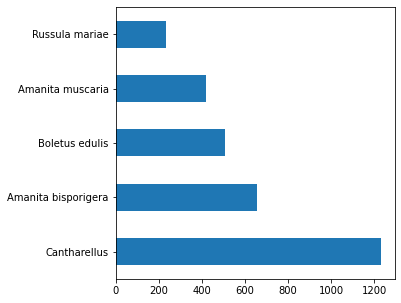

In [5]:
labels_csv["Species"].value_counts().plot.barh(figsize=(5,5))


In [6]:
labels_csv["Species"].value_counts().mean()

609.4

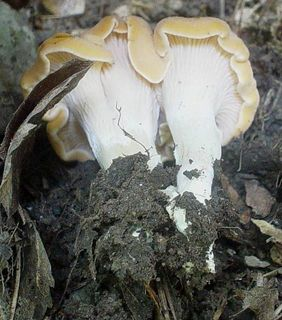

In [7]:
from IPython.display import Image
Image("C:/Users/Grunk/Desktop/Project/basedata3/Cantharellus/101349.jpg")

In [8]:

file_names = file_path + labels_csv["Species"] + "/" + labels_csv["Name"]
file_names.head()
file_names[2880]

'C:/Users/Grunk/Desktop/Project/basedata3/Amanita muscaria/Amanita_muscaria69.png'

In [9]:
filenames= [ fname for fname in file_names]
filenames[:10]

['C:/Users/Grunk/Desktop/Project/basedata3/Amanita bisporigera/100598.jpg',
 'C:/Users/Grunk/Desktop/Project/basedata3/Amanita bisporigera/100599.jpg',
 'C:/Users/Grunk/Desktop/Project/basedata3/Amanita bisporigera/100600.jpg',
 'C:/Users/Grunk/Desktop/Project/basedata3/Amanita bisporigera/100626.jpg',
 'C:/Users/Grunk/Desktop/Project/basedata3/Amanita bisporigera/100628.jpg',
 'C:/Users/Grunk/Desktop/Project/basedata3/Amanita bisporigera/100629.jpg',
 'C:/Users/Grunk/Desktop/Project/basedata3/Amanita bisporigera/100630.jpg',
 'C:/Users/Grunk/Desktop/Project/basedata3/Amanita bisporigera/100631.jpg',
 'C:/Users/Grunk/Desktop/Project/basedata3/Amanita bisporigera/101388.jpg',
 'C:/Users/Grunk/Desktop/Project/basedata3/Amanita bisporigera/101389.jpg']

In [10]:
import numpy as np
labels = labels_csv["Species"].to_numpy()
#labels = np.array(labels)
labels

array(['Amanita bisporigera', 'Amanita bisporigera',
       'Amanita bisporigera', ..., 'Boletus edulis', 'Boletus edulis',
       'Boletus edulis'], dtype=object)

In [11]:
#Find unique label values
unique_species = np.unique(labels)
len(unique_species)

5

In [12]:
#Turn every label into a boolean array
boolean_labels = [label == np.array(unique_species) for label in labels]
boolean_labels[:2]

[array([ True, False, False, False, False]),
 array([ True, False, False, False, False])]

###Creating a validation set

In [13]:
#SEtup up X & y variables
X = filenames 
y=boolean_labels

In [14]:
#There are 3139 images. 
#Set number of images to use for experimenting.
#Will start with 1000
NUM_IMAGES = 2092 #@param{type:"slider", min:1000, max:3139}

In [17]:
#Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

#Split into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val=train_test_split(X[:NUM_IMAGES],
                                                y[:NUM_IMAGES],
                                                test_size=0.4,
                                                random_state=42)

len(X_train),len(y_train),len(X_val),len(y_val)

(1255, 1255, 837, 837)

In [18]:
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(240, 320, 3)

## Preprocessing images

In [19]:
IMG_SIZE = 224


def process_image(image_path, img_size=IMG_SIZE):
  #read an imafe file
  image = tf.io.read_file(image_path)
  #Turn jpg image into a tensor with 3 channels
  image=tf.image.decode_jpeg(image, channels=3)
  #Convert the color channel values from 0-255 to 0-1values
  image=tf.image.convert_image_dtype(image,tf.float32)
  #Resize the image to a specific value
  image= tf.image.resize(image, size=[IMG_SIZE,IMG_SIZE])
  return image

## Turning our data into batches


In [20]:
#Create a simple function to return a tuple
def get_image_label(image_path, label):
  image = process_image(image_path)
  return image,label

In [21]:
#Defining batch size
BATCH_SIZE=32

# create a function to turn data into batches
def create_data_batches(x,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  # If the data is a test dataset, probably no labels.
  if test_data:
    print("Creating test data batches")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # Else if the data is a valid dataset, no ndea to shuffle.
  elif valid_data:
    print("Creating Validation Data batches")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),#filepaths
                                             tf.constant(y)))# labels
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  
  else:
    print("creating training data batchs")
    #Turn filepaths and labels into tensors
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                             tf.constant(y)))
    #shuffling pathnames and labels before mapping image process
    data = data.shuffle(buffer_size=len(x))

    #create(image,label) tuples (turns image path into preprocessed image)
    data=data.map(get_image_label)

    #Turn training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [22]:
#create trainig and validation data batchs
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

creating training data batchs
Creating Validation Data batches


In [23]:
#Check different attributes of data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 5), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 5), dtype=tf.bool, name=None)))

###Visualizing our data batches

In [24]:
import matplotlib.pyplot as plt

#create function for viewing images in a data batch
def show_25_images(images,labels):
  ##Displays plot of 25 images and their labels in a batch
  plt.figure(figsize=(10,10))
  for i in range(25):
    #create subplots
    ax = plt.subplot(5,5,i+1)
    #Display an image
    plt.imshow(images[i])
    #Add image label
    plt.title(unique_species[labels[i].argmax()])
    plt.axis("off")
    

In [25]:
train_images, train_labels = next(train_data.as_numpy_iterator())

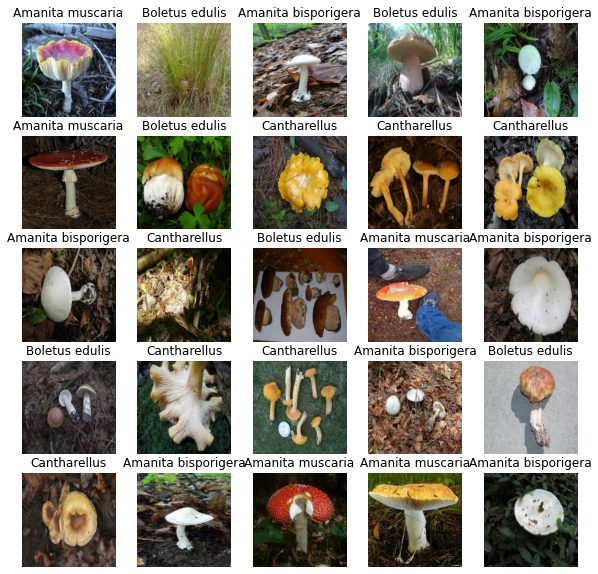

In [26]:
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images,train_labels)

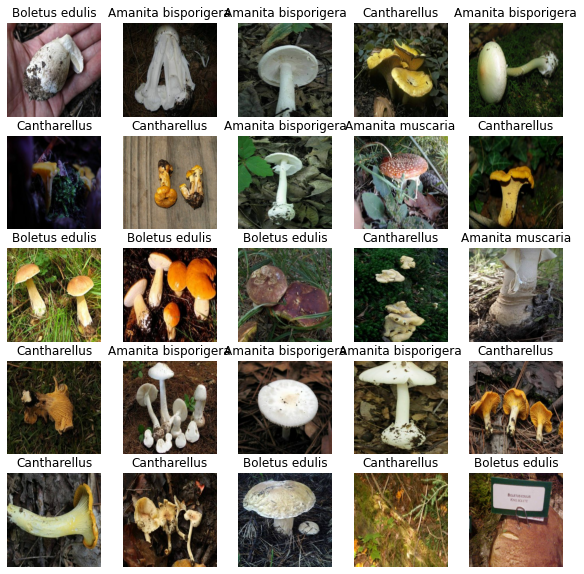

In [27]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Importing InceptionV3 

## Creating the model structure and display summary of the structure

In [28]:
INPUT_SHAPE=[None, IMG_SIZE, IMG_SIZE,3]
OUTPUT_SHAPE=len(unique_species)
MODEL_URL = "https://tfhub.dev/google/tf2-preview/inception_v3/classification/4"

In [29]:
def create_model(input_shape=INPUT_SHAPE,output_shape = OUTPUT_SHAPE,model_url=MODEL_URL):
  print("BUilding model with: ", MODEL_URL)
  model = tf.keras.Sequential([
                               hub.KerasLayer(MODEL_URL),
                               tf.keras.layers.Dense(units=len(unique_species),
                                                     activation = "softmax")])
  model.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
                )
  model.build(INPUT_SHAPE)
  return model

In [30]:
#creating a model object
model = create_model()

BUilding model with:  https://tfhub.dev/google/tf2-preview/inception_v3/classification/4


In [31]:
#View the structure of the model
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              23853833  
                                                                 
 dense (Dense)               (None, 5)                 5010      
                                                                 
Total params: 23,858,843
Trainable params: 5,010
Non-trainable params: 23,853,833
_________________________________________________________________


## Creating callbacks
## Load TensorBoard notebook extension
To setup a tensorboard callback, need to do 3 things. 
Load tensorboard extension
create a tensorboard callback which is able to save logs to a directory and pass it to our models fit function
visualize the training logs with tensorboard.

In [32]:
%load_ext tensorboard

In [33]:
import datetime,os

## Early stopping Callback
Stops the model from overfitting by stopping training if a certain metric stops improving.

In [34]:
#create early stopping calback
def create_tensorboard_callback():
  #Create a log directory for storing longs for tensorboard
  logdir = os.path.join("C:/Users/Grunk/Desktop/Project/logs",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  histogram_freq=1,
  return tf.keras.callbacks.TensorBoard(logdir)


early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",patience=4)

## Training a model

In [35]:
NUM_EPOCHS = 100 #@param {type:"slider",min:1,max:25,step:1}

In [36]:
tensorboard=create_tensorboard_callback()
r = model.fit(x=train_data,
          epochs=NUM_EPOCHS,
          validation_data=val_data,
          validation_freq=1,
          callbacks=[tensorboard,early_stopping
                     ]
          )

Epoch 1/100
40/40 [==============================] - 12s 84ms/step - loss: 1.2148 - accuracy: 0.6151 - val_loss: 0.6188 - val_accuracy: 0.8112
Epoch 2/100
40/40 [==============================] - 2s 50ms/step - loss: 0.4313 - accuracy: 0.8534 - val_loss: 0.5323 - val_accuracy: 0.8339
Epoch 3/100
40/40 [==============================] - 2s 49ms/step - loss: 0.3145 - accuracy: 0.8884 - val_loss: 0.4857 - val_accuracy: 0.8459
Epoch 4/100
40/40 [==============================] - 2s 49ms/step - loss: 0.2445 - accuracy: 0.9100 - val_loss: 0.4568 - val_accuracy: 0.8542
Epoch 5/100
40/40 [==============================] - 2s 49ms/step - loss: 0.2053 - accuracy: 0.9291 - val_loss: 0.4240 - val_accuracy: 0.8590
Epoch 6/100
40/40 [==============================] - 2s 49ms/step - loss: 0.1724 - accuracy: 0.9458 - val_loss: 0.4320 - val_accuracy: 0.8590
Epoch 7/100
40/40 [==============================] - 2s 50ms/step - loss: 0.1425 - accuracy: 0.9586 - val_loss: 0.4197 - val_accuracy: 0.8638
Epoch

# Fitting the model

## Training InceptionV3 model on a subset of data.
Our model is going to train on 1000 images.


In [37]:
print("GPU", "available(YES)" if tf.config.list_physical_devices("GPU") else"not available")

GPU available(YES)


##Checking the Tensorboard logs

In [38]:
%tensorboard --logdir drive/MyDrive/Test/logs
#drive/MyDrive/logs

In [39]:
predictions = model.predict(val_data, verbose=1)
predictions

27/27 [==============================] - 2s 40ms/step


array([[4.14690636e-02, 4.92553285e-04, 9.57498610e-01, 5.39678556e-04,
        1.21285780e-07],
       [7.49675274e-01, 2.32623770e-05, 6.77283533e-05, 2.50232816e-01,
        9.57826387e-07],
       [9.99579370e-01, 3.77471156e-06, 3.47478548e-04, 6.93707552e-05,
        1.08370235e-09],
       ...,
       [9.90396023e-01, 7.57280178e-03, 2.03065714e-03, 4.32937298e-07,
        1.50334998e-07],
       [7.63800745e-06, 2.34658933e-06, 2.70913448e-03, 9.97280598e-01,
        2.06577369e-07],
       [1.16519644e-07, 9.99595940e-01, 1.87801550e-06, 4.01703874e-04,
        3.05511151e-07]], dtype=float32)

In [40]:
def get_pred_label(prediction_probabilities):
  return unique_species[np.argmax(prediction_probabilities)]


In [41]:

pred_label=get_pred_label(predictions[0])
pred_label

'Boletus edulis'

##Unbatching validation data

In [42]:
#create a function to unbatch a batch dataset
def unbatchify(data):
  #takes a batch dataset of tensors and returns seperate arrays of images,labels
  images = []
  labels = []
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_species[np.argmax(label)])
  return images, labels

val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.48750502, 0.36963788, 0.37759107],
         [0.4706783 , 0.35285115, 0.3557423 ],
         [0.45447183, 0.33628452, 0.33585435],
         ...,
         [0.5726691 , 0.43093255, 0.47042826],
         [0.56176466, 0.4247899 , 0.462605  ],
         [0.5368344 , 0.40742266, 0.44271678]],
 
        [[0.48240298, 0.3577531 , 0.3679272 ],
         [0.464976  , 0.34144658, 0.34661865],
         [0.45003006, 0.3239496 , 0.32706085],
         ...,
         [0.5763607 , 0.43462414, 0.47411987],
         [0.5653961 , 0.42842138, 0.46623647],
         [0.54019576, 0.41078404, 0.44607815]],
 
        [[0.47760108, 0.34454784, 0.34901962],
         [0.45977393, 0.32784116, 0.3322129 ],
         [0.4454282 , 0.31199482, 0.31540617],
         ...,
         [0.5815127 , 0.4384756 , 0.4786216 ],
         [0.56344527, 0.42572024, 0.46378547],
         [0.53434336, 0.4044815 , 0.43992567]],
 
        ...,
 
        [[0.36175475, 0.20097044, 0.21665671],
         [0.35117048, 0.19038618, 0.20607

##Visualizing model predictions


In [43]:
#imports
import matplotlib.pyplot as plt

In [44]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  pred_prob,true_label, image=prediction_probabilities[n], labels[n], images[n]
  pred_label = get_pred_label(pred_prob)
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  #Change the color of the title 
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% {}".format(pred_label, 
                                    np.max(pred_prob)*100,
                                    true_label),
            color = color
  )
  

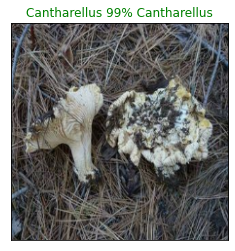

In [45]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=45
          )

###View our models Top 10 predictions
Take an input of prediction probabilities array, and grount truth array and an int.
Find prediction using get_pred_label()
Find top 10 Pred prob index, values and labels.

In [46]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  pred_prob, true_label = prediction_probabilities[n], labels[n]
  pred_label=get_pred_label(pred_prob)
  #confidence index
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  #confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  #pred labels
  top_10_pred_labels= unique_species[top_10_pred_indexes]
  #setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                               top_10_pred_values,
                               color="grey"
  )
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  
  #change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass


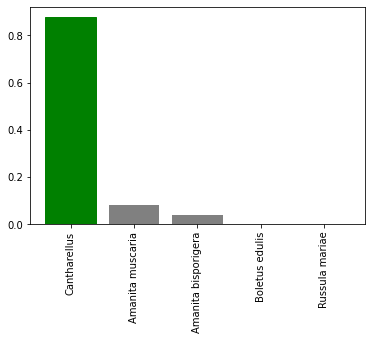

In [47]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=5)

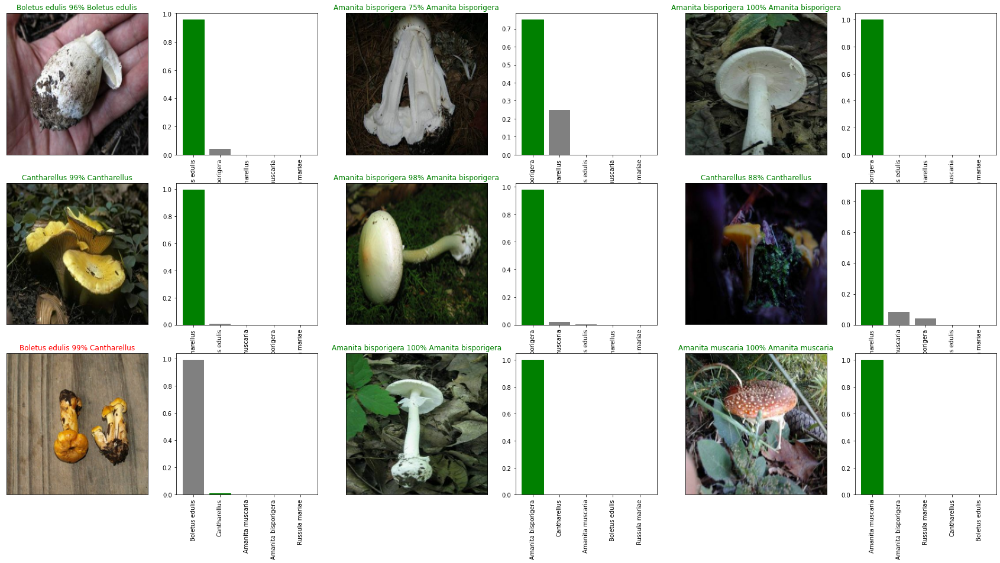

In [48]:
i_multiplier = 0
num_rows=3
num_cols=3
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot (num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.show()

In [49]:
acc = model.evaluate(val_data,steps=len(val_data),verbose=2)
print('%.2f'%(acc[1]*100))

27/27 - 1s - loss: 0.4281 - accuracy: 0.8757 - 791ms/epoch - 29ms/step
87.57


# Saving the model


In [69]:
def save_model(model, suffix=None):
  modeldir = os.path.join("C:/Users/Grunk/Desktop/Project/model",
                          datetime.datetime.now().strftime("%Y-%m-%d-%H-%M-%p"))
  model_path=modeldir+"-" + suffix + ".h5"
  print(f"Saving model to: {model_path}")
  model.save(model_path)
  return model_path

In [70]:
#create a function to save a model
#from tensorflow.keras.models import load_model
#model.save('1010_images_model_inceptionv3.h5')
def load_model(model_path):
  print(f"loading model from: {model_path}")
  model=tf.keras.models.load_model(model_path,
                                   custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [72]:
saved_model = save_model(model, suffix="partial")

Saving model to: C:/Users/Grunk/Desktop/Project/model\2022-07-05-02-38-AM-partial.h5


# Loading a model

In [73]:
loaded_1000_model = load_model(saved_model)

loading model from: C:/Users/Grunk/Desktop/Project/model\2022-07-05-02-38-AM-partial.h5


In [74]:
#evaluate the presaved model
model.evaluate(val_data)

27/27 [==============================] - 1s 35ms/step - loss: 0.4281 - accuracy: 0.8757


[0.42813000082969666, 0.8757467269897461]

In [75]:
loaded_1000_model.evaluate(val_data)

27/27 [==============================] - 1s 30ms/step - loss: 0.4281 - accuracy: 0.8757


[0.42813000082969666, 0.8757467269897461]

##Training a  model on full data.

In [76]:
full_data = create_data_batches(X,y)

creating training data batchs


In [77]:
full_model = create_model()
full_model.summary()

BUilding model with:  https://tfhub.dev/google/tf2-preview/inception_v3/classification/4
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_1 (KerasLayer)  (None, 1001)              23853833  
                                                                 
 dense_1 (Dense)             (None, 5)                 5010      
                                                                 
Total params: 23,858,843
Trainable params: 5,010
Non-trainable params: 23,853,833
_________________________________________________________________


In [78]:
full_model_tensorboard = create_tensorboard_callback()
full_model_early_callback = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience = 3)

In [79]:
r2 = full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,
                          full_model_early_callback])

Epoch 1/100
96/96 [==============================] - 7s 33ms/step - loss: 0.8942 - accuracy: 0.7184
Epoch 2/100
96/96 [==============================] - 3s 30ms/step - loss: 0.4476 - accuracy: 0.8471
Epoch 3/100
96/96 [==============================] - 3s 30ms/step - loss: 0.3457 - accuracy: 0.8832
Epoch 4/100
96/96 [==============================] - 3s 30ms/step - loss: 0.2968 - accuracy: 0.8966
Epoch 5/100
96/96 [==============================] - 3s 30ms/step - loss: 0.2559 - accuracy: 0.9127
Epoch 6/100
96/96 [==============================] - 3s 30ms/step - loss: 0.2306 - accuracy: 0.9212
Epoch 7/100
96/96 [==============================] - 3s 30ms/step - loss: 0.2103 - accuracy: 0.9285
Epoch 8/100
96/96 [==============================] - 3s 30ms/step - loss: 0.1942 - accuracy: 0.9373
Epoch 9/100
96/96 [==============================] - 3s 30ms/step - loss: 0.1734 - accuracy: 0.9481
Epoch 10/100
96/96 [==============================] - 3s 30ms/step - loss: 0.1655 - accuracy: 0.9432

In [80]:
%tensorboard --logdir drive/MyDrive/Test/logs

Reusing TensorBoard on port 6006 (pid 19556), started 0:09:20 ago. (Use '!kill 19556' to kill it.)

In [81]:
#from tensorflow.keras.models import load_model
#full_model.save('full_model_inceptionv3.h5')
loaded_full_data_model = save_model(full_model,suffix="full_model_IV3")

Saving model to: C:/Users/Grunk/Desktop/Project/model\2022-07-05-02-40-AM-full_model_IV3.h5


In [82]:
loaded_full_model = load_model(loaded_full_data_model)

loading model from: C:/Users/Grunk/Desktop/Project/model\2022-07-05-02-40-AM-full_model_IV3.h5


##Making Predictions on test dataset

In [83]:
test_path = "C:/Users/Grunk/Desktop/Project/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
print(test_filenames[:10])
print(len(test_filenames))

['C:/Users/Grunk/Desktop/Project/test/3rm.jpg', 'C:/Users/Grunk/Desktop/Project/test/ab.jpg', 'C:/Users/Grunk/Desktop/Project/test/ab1.jpg', 'C:/Users/Grunk/Desktop/Project/test/ab2.jpg', 'C:/Users/Grunk/Desktop/Project/test/ab3.jpg', 'C:/Users/Grunk/Desktop/Project/test/ab4.jpg', 'C:/Users/Grunk/Desktop/Project/test/am (1).jpeg', 'C:/Users/Grunk/Desktop/Project/test/am (1).jpg', 'C:/Users/Grunk/Desktop/Project/test/am (2).jpg', 'C:/Users/Grunk/Desktop/Project/test/am (3).jpg']
34


In [84]:
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches


In [85]:
test_predictions = loaded_full_model.predict(test_data,verbose=1)

2/2 [==============================] - 1s 648ms/step


In [86]:
np.savetxt("C:/Users/Grunk/Desktop/Project/test_predictions.csv", test_predictions, delimiter=',')

In [87]:
test_predictions=np.loadtxt("C:/Users/Grunk/Desktop/Project/test_predictions.csv",delimiter=',')

In [88]:
test_predictions.shape

(34, 5)

In [89]:
test_pred_labels = [get_pred_label(test_predictions[i]) for i in range(len(test_predictions))]
test_pred_labels

['Russula mariae',
 'Amanita bisporigera',
 'Amanita bisporigera',
 'Amanita bisporigera',
 'Amanita bisporigera',
 'Amanita bisporigera',
 'Amanita muscaria',
 'Amanita muscaria',
 'Amanita muscaria',
 'Amanita muscaria',
 'Amanita muscaria',
 'Amanita muscaria',
 'Amanita bisporigera',
 'Amanita bisporigera',
 'Amanita bisporigera',
 'Boletus edulis',
 'Boletus edulis',
 'Boletus edulis',
 'Boletus edulis',
 'Boletus edulis',
 'Boletus edulis',
 'Cantharellus',
 'Cantharellus',
 'Cantharellus',
 'Cantharellus',
 'Cantharellus',
 'Cantharellus',
 'Russula mariae',
 'Russula mariae',
 'Boletus edulis',
 'Russula mariae',
 'Russula mariae',
 'Russula mariae',
 'Amanita bisporigera']

In [90]:
#Get Test images
custom_images = []
#loop thru unbatched data
for image in test_data.unbatch().as_numpy_iterator():
  custom_images.append(image)


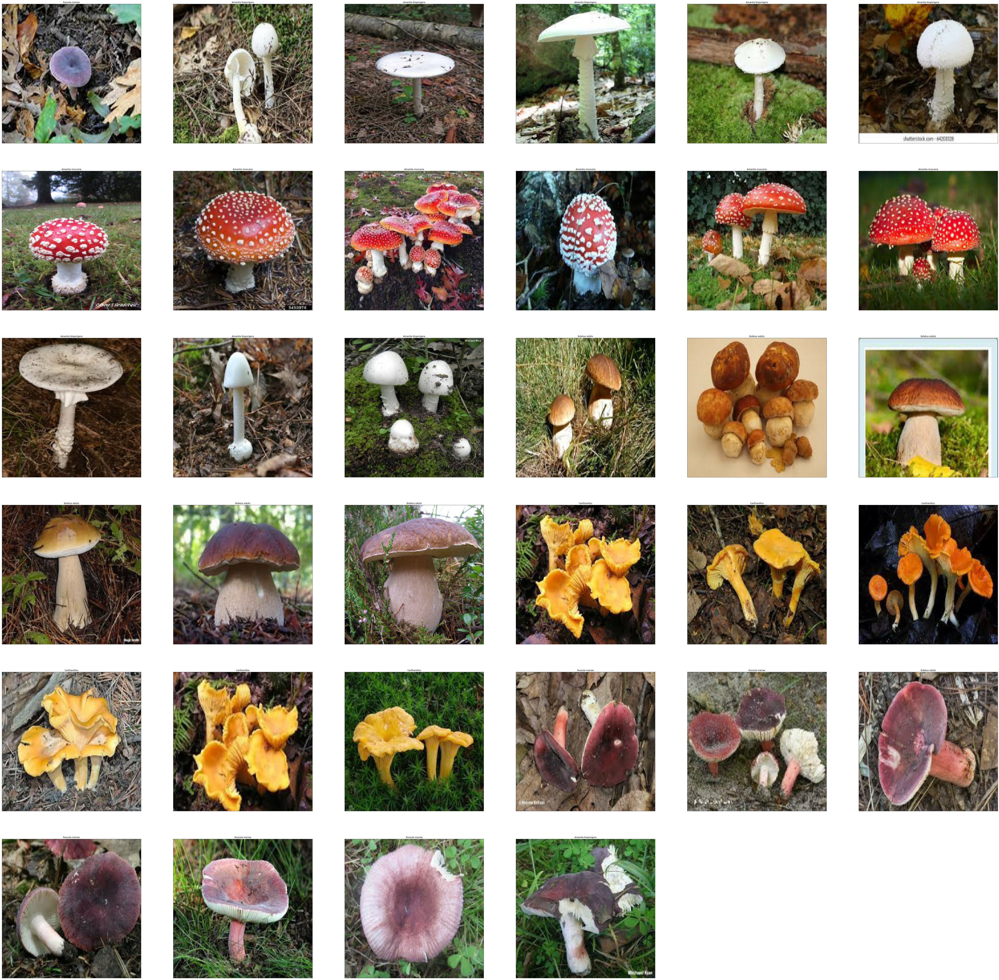

In [91]:

#Check custom image predictions
plt.figure(figsize=(100,100))
for i, image in enumerate(custom_images):
  plt.subplot(6,6,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(test_pred_labels[i])
  plt.imshow(image)

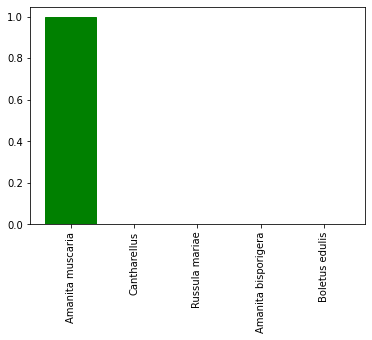

In [92]:
plot_pred_conf(prediction_probabilities=test_predictions,
               labels=val_labels,
               n=8)

In [93]:
print(test_predictions[0])
print(f"Max Value(probability of prediction:{np.max(test_predictions[0])}")
print(f"Sum: {np.sum(test_predictions[0])}")
print(f"Max index: {np.argmax(test_predictions[0])}")
print(f"Predicted labal:{unique_species[np.argmax(test_predictions[0])]}")

[1.89592920e-05 6.34593903e-07 4.57923583e-08 1.25439774e-05
 9.99967813e-01]
Max Value(probability of prediction:0.9999678134918213
Sum: 0.9999999971474658
Max index: 4
Predicted labal:Russula mariae


In [94]:
test_predictions[0]

array([1.89592920e-05, 6.34593903e-07, 4.57923583e-08, 1.25439774e-05,
       9.99967813e-01])

In [95]:
acc = model.evaluate(test_data,steps=len(test_data),verbose=2)
print('%.2f'%(acc[1]*100))

2/2 - 0s - loss: 0.0000e+00 - accuracy: 0.0000e+00 - 260ms/epoch - 130ms/step
0.00


In [96]:
acc2 = full_model.evaluate(test_data,steps=len(test_data),verbose=2)
print('%.2f'%(acc[1]*100))

2/2 - 0s - loss: 0.0000e+00 - accuracy: 0.0000e+00 - 216ms/epoch - 108ms/step
0.00


# Plotting loss and Accuracy

## Plotting Loss InceptionV3

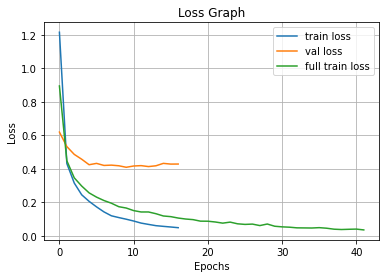

In [97]:
plt.plot(r.history['loss'], label='train loss')
plt.plot(r.history['val_loss'], label='val loss')
plt.plot(r2.history['loss'], label='full train loss')
plt.grid(True)
plt.title("Loss Graph")
plt.ylabel("Loss")
plt.xlabel("Epochs")
plt.legend()
plt.savefig(datetime.datetime.now().strftime("%Y%m%d-%H%M%S")+'_'+'2_model_IV3_Loss.png',dpi=100, facecolor='w')
plt.show()


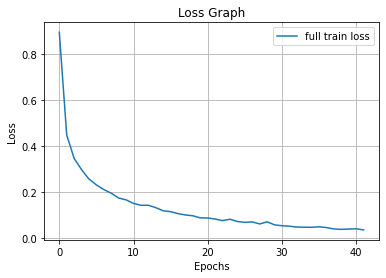

In [98]:
plt.plot(r2.history['loss'], label='full train loss')
plt.grid(True)
plt.title("Loss Graph")
plt.ylabel("Loss")
plt.xlabel("Epochs")
plt.legend()
plt.savefig(datetime.datetime.now().strftime("%Y%m%d-%H%M%S")+'_'+'IV3_Full_Loss.png',dpi=100, facecolor='w')
plt.show()


## Plotting Accuracy InceptionV3

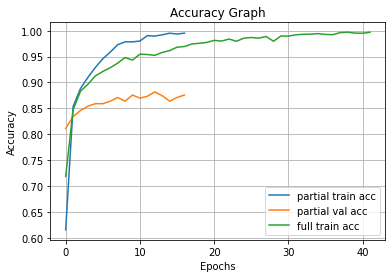

In [99]:
plt.plot(r.history['accuracy'], label='partial train acc')
plt.plot(r.history['val_accuracy'], label='partial val acc')
plt.plot(r2.history['accuracy'], label='full train acc')
plt.grid(True)
plt.title("Accuracy Graph")
plt.ylabel("Accuracy")
plt.xlabel("Epochs")
plt.legend()
plt.draw()
plt.savefig(datetime.datetime.now().strftime("%Y%m%d-%H%M%S")+'_'+'2_model_IV3_acc',dpi=100,facecolor='w')
plt.show()

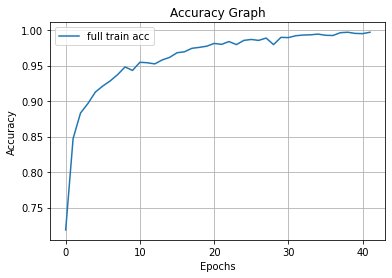

In [100]:
plt.plot(r2.history['accuracy'], label='full train acc')
plt.grid(True)
plt.title("Accuracy Graph")
plt.ylabel("Accuracy")
plt.xlabel("Epochs")
plt.legend()
plt.draw()
plt.savefig(datetime.datetime.now().strftime("%Y%m%d-%H%M%S")+'_'+'IV3_full_acc',dpi=100,facecolor='w')
plt.show()

# Solving "PIL.UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7f13b3e01c50>"

There seems to be an issue regarding an image. The following code will read thru the specified folders and print out the image that is causing issues. 

1 image was found in Cantharellus, '587054' and was promptly deleted.
After deletion, make sure to rerun runtime.

### Switched to text to avoid running this code again.

import PIL
from pathlib import Path
from PIL import UnidentifiedImageError

path = Path("/content/drive/MyDrive/MushVision/basedata/testing").rglob("*.jpg")
for img_p in path:
    try:
        img = PIL.Image.open(img_p)
    except PIL.UnidentifiedImageError:
            print(img_p)

import PIL
from pathlib import Path
from PIL import UnidentifiedImageError

path = Path("/content/drive/MyDrive/MushVision/basedata/training").rglob("*.jpg")
for img_p in path:
    try:
        img = PIL.Image.open(img_p)
    except PIL.UnidentifiedImageError:
            print(img_p)